<a href="https://colab.research.google.com/github/elifftosunn/Breast-Cancer-Classification/blob/main/BreastCancerClassification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from warnings import filterwarnings
filterwarnings('ignore') 

In [ ]:
!ls

drive  sample_data


In [ ]:
!cd drive/MyDrive/Colab\ Notebooks/

In [ ]:
df = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/datas/breast-cancer-data.csv")
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [ ]:
df.columns

Index(['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')

1.   Diagnosis: Tanı
2.   Radius: Yarıçap
3.   Texture: Doku
4.   Perimeter: Çevre
5.   Area: Alan
6.   Smoothness: Düzgünlük
7.   Compactness: Kompaktlık
8.   Concavity: İçBükeylik
9.   Concave Points: İçBükey Noktalar
10.  Symmetry: Simetri
11.  Fractal Dimension: Fraktal Boyut

---
Her görüntü için bu özelliklerin ortalaması, standart hatası ve “en kötü” 
veya en büyüğü (en büyük üç değerin ortalaması) hesaplandı ve 30 özellik elde edildi. Örneğin, alan 3, Ortalama Yarıçap, alan 13, Yarıçap SE, alan 23, En Kötü Yarıçaptır.

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

In [ ]:
df = df.drop("id",axis=1)

In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
radius_mean,569.0,14.127292,3.524049,6.981000,11.700000,13.370000,15.780000,28.11000
texture_mean,569.0,19.289649,4.301036,9.710000,16.170000,18.840000,21.800000,39.28000
perimeter_mean,569.0,91.969033,24.298981,43.790000,75.170000,86.240000,104.100000,188.50000
area_mean,569.0,654.889104,351.914129,143.500000,420.300000,551.100000,782.700000,2501.00000
smoothness_mean,569.0,0.096360,0.014064,0.052630,0.086370,0.095870,0.105300,0.16340
compactness_mean,569.0,0.104341,0.052813,0.019380,0.064920,0.092630,0.130400,0.34540
concavity_mean,569.0,0.088799,0.079720,0.000000,0.029560,0.061540,0.130700,0.42680
concave points_mean,569.0,0.048919,0.038803,0.000000,0.020310,0.033500,0.074000,0.20120
symmetry_mean,569.0,0.181162,0.027414,0.106000,0.161900,0.179200,0.195700,0.30400
fractal_dimension_mean,569.0,0.062798,0.007060,0.049960,0.057700,0.061540,0.066120,0.09744


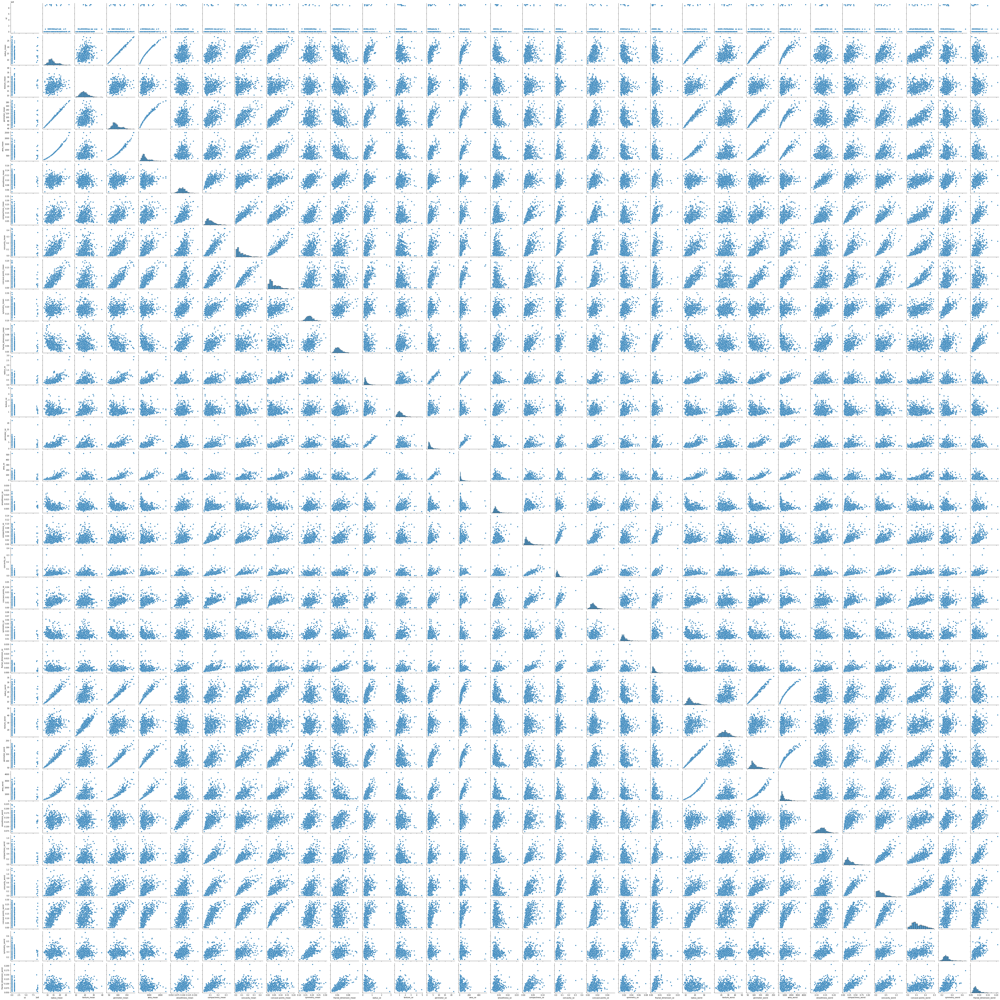

In [ ]:
sns.pairplot(df)

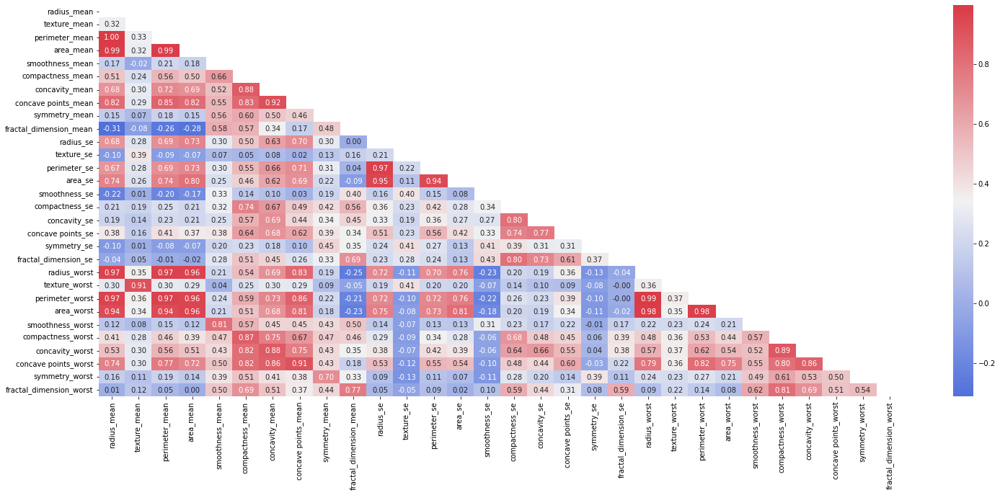

In [ ]:
plt.figure(figsize=(25,10))
cmap = sns.diverging_palette(260, 10, as_cmap=True)
corr = df.corr()
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
sns.heatmap(corr, annot = True, fmt = ".2f", cmap = cmap, mask = mask)
plt.show()

B    357
M    212
Name: diagnosis, dtype: int64

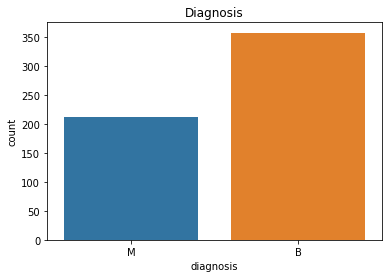

In [ ]:
sns.countplot(df.diagnosis)
plt.title("Diagnosis")
df.diagnosis.value_counts()

İyi huylu kanser sayisinin daha fazla oldugunu goruyoruz

In [ ]:
def colSplit(df,limit):
  num_cols = [col for col in df.columns if df[col].dtype != "O" and df[col].nunique() > limit]
  cat_cols = [col for col in df.columns if df[col].dtype == "O" and df[col].nunique() <= limit]
  cat_but_num = [col for col in df.columns if df[col].dtype == "O" and df[col].nunique() > limit]
  num_but_cat = [col for col in df.columns if df[col].dtype != "O" and df[col].nunique() <= limit]
  cat_cols = cat_cols + num_but_cat
  return cat_cols, num_cols, cat_but_num
cat_cols, num_cols, cat_but_num = colSplit(df,10)
print("Categoric Columns: {}\nNumeric Columns: {}\nCategoric but Numeric Columns: {}".format(cat_cols, num_cols, cat_but_num))

Categoric Columns: ['diagnosis']
Numeric Columns: ['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave points_worst', 'symmetry_worst', 'fractal_dimension_worst']
Categoric but Numeric Columns: []


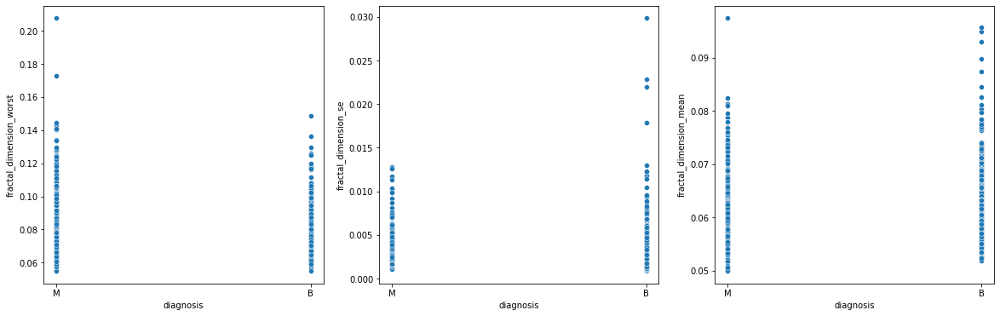

In [ ]:
fig, axes = plt.subplots(nrows = 1, ncols = 3, sharex = True, figsize = (20,6))
sns.scatterplot(df.diagnosis, df.fractal_dimension_worst, ax = axes[0])
sns.scatterplot(df.diagnosis, df.fractal_dimension_se, ax = axes[1])
sns.scatterplot(df.diagnosis, df.fractal_dimension_mean, ax = axes[2])

In [ ]:
df.columns

Index(['diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')

In [ ]:
len(num_cols)

30

<Figure size 432x288 with 0 Axes>

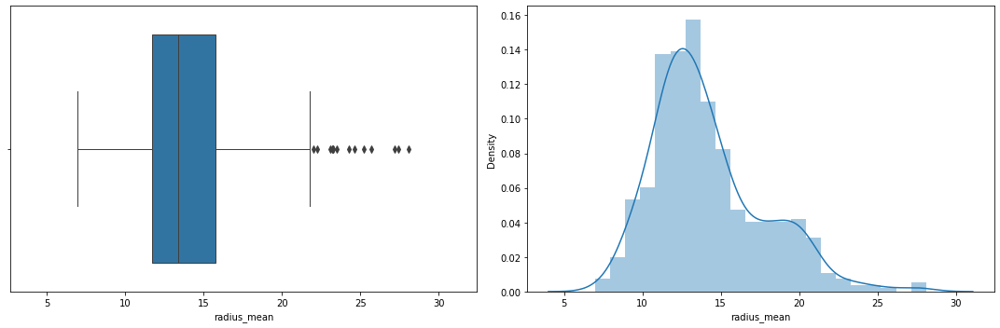

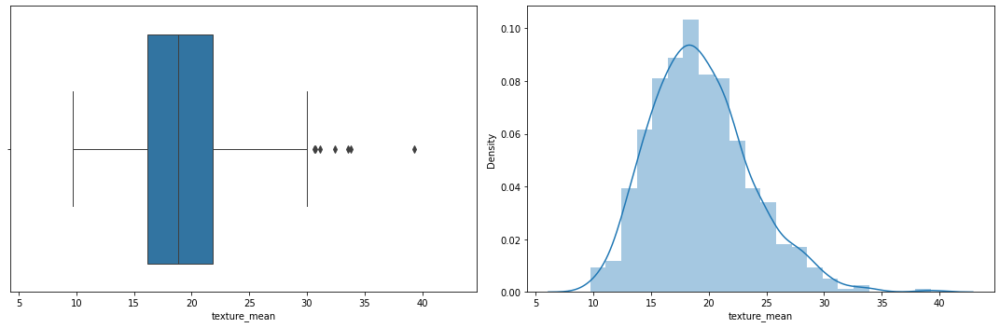

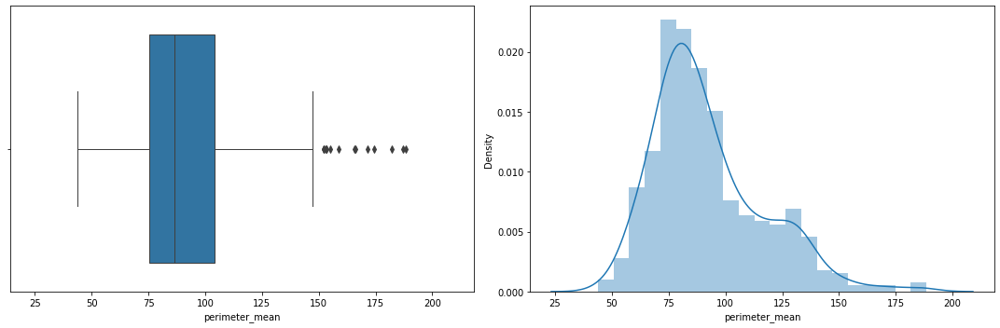

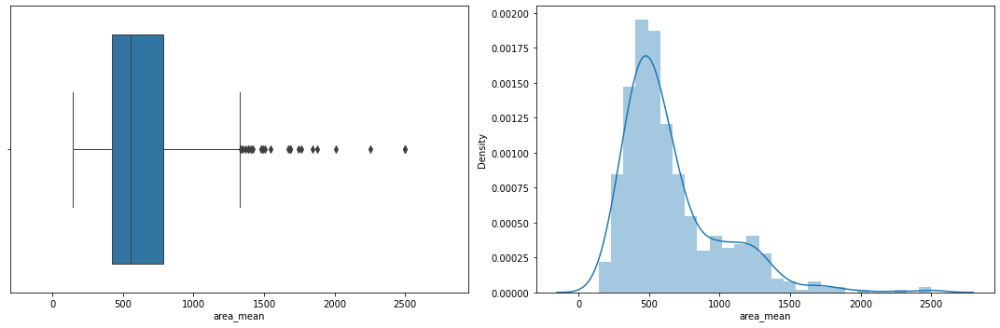

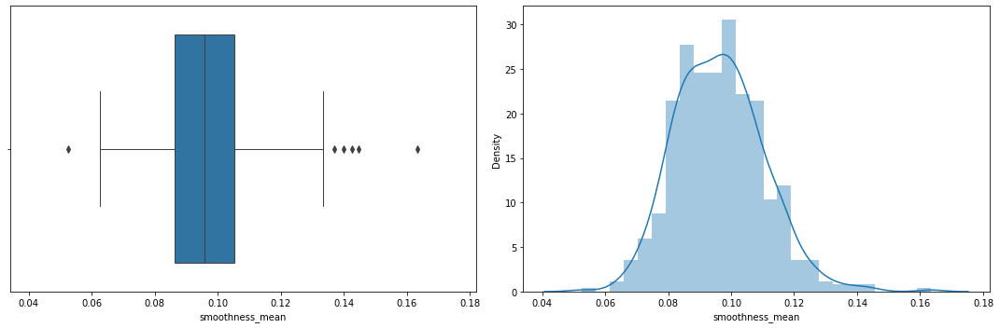

...

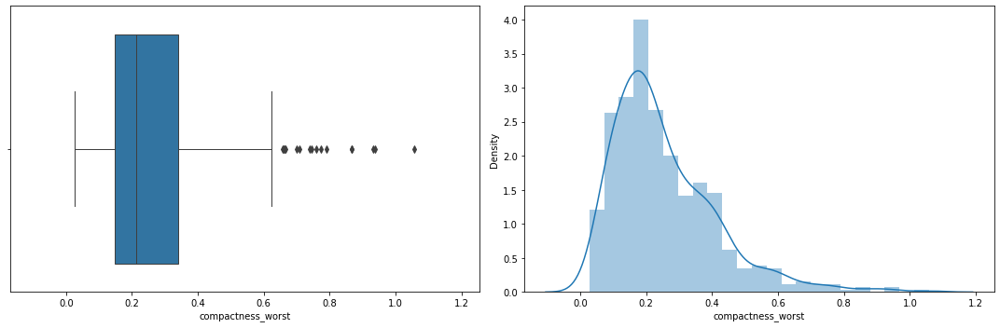

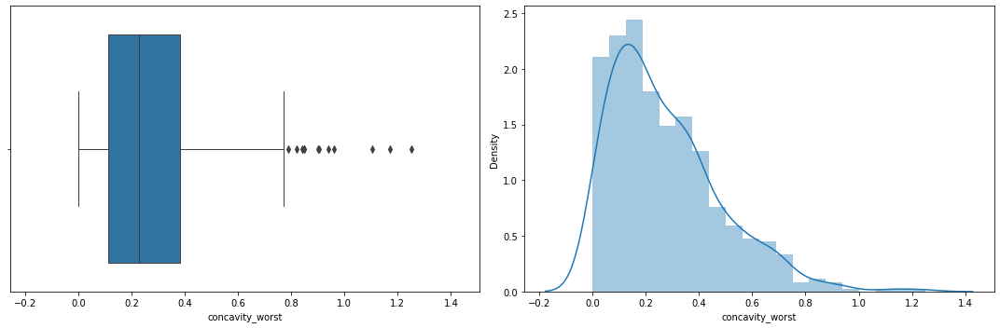

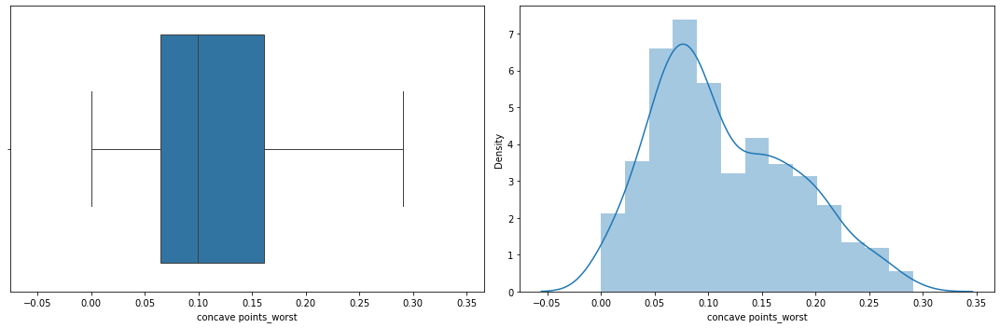

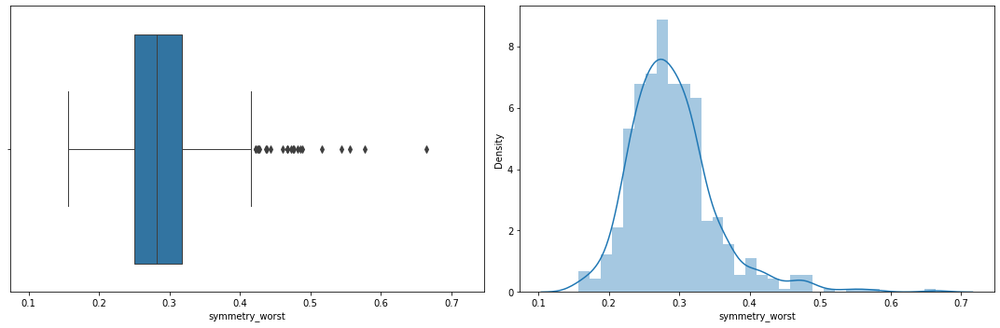

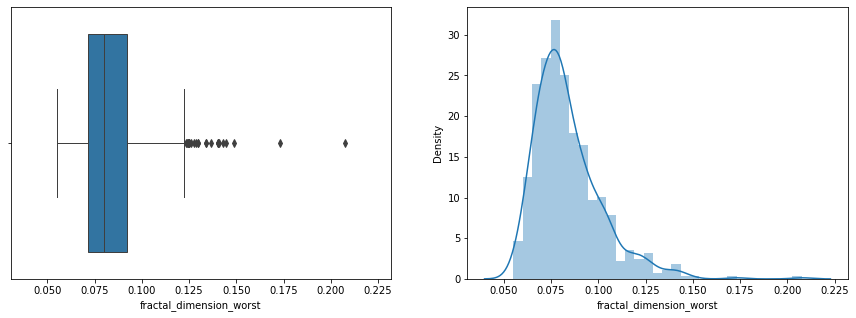

In [ ]:
for col in num_cols:
    plt.tight_layout()
    fig, (ax_box, ax_hist) = plt.subplots(1,2, sharex = True, figsize = (15,5))
    sns.boxplot(df[col], ax = ax_box, linewidth = 1)
    sns.distplot(df[col], ax = ax_hist)

for col in num_cols: 
    quantile = [0.1,0.25,0.35,0.4,0.55,0.63,0.72,0.85,0.95,0.99]
    print(df[col].describe(quantile))

In [ ]:
def outlierThreshold(df,col,q1,q3):
    Q1 = df[col].quantile(q1)
    Q3 = df[col].quantile(q3)
    iqr = Q3 - Q1
    lowerLimit = Q1 - iqr * 1.5
    upperLimit = Q3 + iqr * 1.5
    return lowerLimit, upperLimit
def isThereOutlier(df,col, q1, q3):
    lowerLimit, upperLimit = outlierThreshold(df,col, q1, q3)
    outlierDf = df.loc[(df[col] < lowerLimit) | (df[col] > upperLimit)]
    if outlierDf.any(axis = None):
        return True
    else: 
        return False 
outlierCols = []
for col in num_cols:
    print(col,": ", isThereOutlier(df, col, q1 = 0.25, q3 = 0.75))
    if isThereOutlier(df, col, q1 = 0.25, q3 = 0.75) == True:
        outlierCols.append(col)

radius_mean :  True
texture_mean :  True
perimeter_mean :  True
area_mean :  True
smoothness_mean :  True
compactness_mean :  True
concavity_mean :  True
concave points_mean :  True
symmetry_mean :  True
fractal_dimension_mean :  True
radius_se :  True
texture_se :  True
perimeter_se :  True
area_se :  True
smoothness_se :  True
compactness_se :  True
concavity_se :  True
concave points_se :  True
symmetry_se :  True
fractal_dimension_se :  True
radius_worst :  True
texture_worst :  True
perimeter_worst :  True
area_worst :  True
smoothness_worst :  True
compactness_worst :  True
concavity_worst :  True
concave points_worst :  False
symmetry_worst :  True
fractal_dimension_worst :  True


In [ ]:
for col in outlierCols:
    lowerLimit, upperLimit = outlierThreshold(df, col, q1 = 0.25, q3 = 0.75)
    #print("lowerLimit: {}\nupperLimit: {}".format(lowerLimit,upperLimit))
    df = df.loc[(df[col] > lowerLimit) & (df[col] < upperLimit)]
for col in outlierCols:
    print(col,": ", isThereOutlier(df, col, q1 = 0.25, q3 = 0.75))

radius_mean :  True
texture_mean :  True
perimeter_mean :  True
area_mean :  True
smoothness_mean :  True
compactness_mean :  True
concavity_mean :  True
concave points_mean :  True
symmetry_mean :  False
fractal_dimension_mean :  True
radius_se :  True
texture_se :  True
perimeter_se :  True
area_se :  True
smoothness_se :  True
compactness_se :  True
concavity_se :  True
concave points_se :  True
symmetry_se :  False
fractal_dimension_se :  True
radius_worst :  True
texture_worst :  True
perimeter_worst :  True
area_worst :  True
smoothness_worst :  False
compactness_worst :  True
concavity_worst :  True
symmetry_worst :  True
fractal_dimension_worst :  True


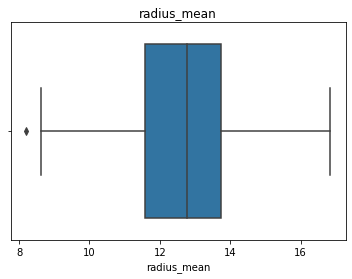

radius_mean
   diagnosis  radius_mean  texture_mean  perimeter_mean  area_mean  \
46         B        8.196         16.84           51.71      201.9   

    smoothness_mean  compactness_mean  concavity_mean  concave points_mean  \
46            0.086           0.05943         0.01588             0.005917   

    symmetry_mean  ...  radius_worst  texture_worst  perimeter_worst  \
46         0.1769  ...         8.964          21.96            57.26   

    area_worst  smoothness_worst  compactness_worst  concavity_worst  \
46       242.2            0.1297             0.1357           0.0688   

    concave points_worst  symmetry_worst  fractal_dimension_worst  
46               0.02564          0.3105                  0.07409  

[1 rows x 31 columns]

Int64Index([46], dtype='int64')


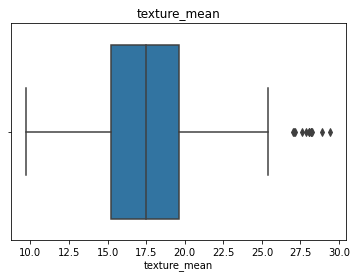

texture_mean
    diagnosis  radius_mean  texture_mean  perimeter_mean  area_mean  \
231         B       11.320         27.08           71.76      395.7   
238         B       14.220         27.85           92.55      623.9   
377         B       13.460         28.21           85.89      562.1   
452         B       12.000         28.23           76.77      442.5   
459         B        9.755         28.20           61.68      290.9   

     smoothness_mean  compactness_mean  concavity_mean  concave points_mean  \
231          0.06883           0.03813         0.01633             0.003125   
238          0.08223           0.10390         0.11030             0.044080   
377          0.07517           0.04726         0.01271             0.011170   
452          0.08437           0.06450         0.04055             0.019450   
459          0.07984           0.04626         0.01541             0.010430   

     symmetry_mean  ...  radius_worst  texture_worst  perimeter_worst  \
231         

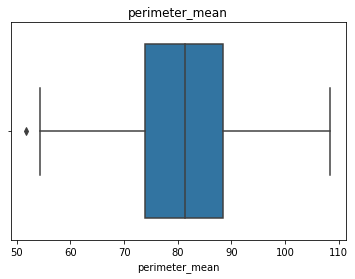

perimeter_mean
   diagnosis  radius_mean  texture_mean  perimeter_mean  area_mean  \
46         B        8.196         16.84           51.71      201.9   

    smoothness_mean  compactness_mean  concavity_mean  concave points_mean  \
46            0.086           0.05943         0.01588             0.005917   

    symmetry_mean  ...  radius_worst  texture_worst  perimeter_worst  \
46         0.1769  ...         8.964          21.96            57.26   

    area_worst  smoothness_worst  compactness_worst  concavity_worst  \
46       242.2            0.1297             0.1357           0.0688   

    concave points_worst  symmetry_worst  fractal_dimension_worst  
46               0.02564          0.3105                  0.07409  

[1 rows x 31 columns]

Int64Index([46], dtype='int64')


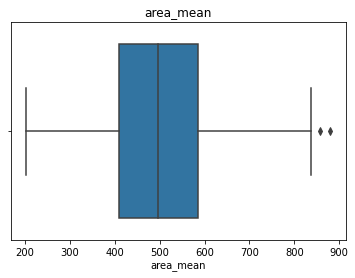

area_mean
    diagnosis  radius_mean  texture_mean  perimeter_mean  area_mean  \
157         B        16.84         19.46           108.4      880.2   
566         M        16.60         28.08           108.3      858.1   

     smoothness_mean  compactness_mean  concavity_mean  concave points_mean  \
157          0.07445           0.07223         0.05150              0.02771   
566          0.08455           0.10230         0.09251              0.05302   

     symmetry_mean  ...  radius_worst  texture_worst  perimeter_worst  \
157         0.1844  ...         18.22          28.07            120.3   
566         0.1590  ...         18.98          34.12            126.7   

     area_worst  smoothness_worst  compactness_worst  concavity_worst  \
157      1032.0           0.08774             0.1710           0.1882   
566      1124.0           0.11390             0.3094           0.3403   

     concave points_worst  symmetry_worst  fractal_dimension_worst  
157               0.08436    

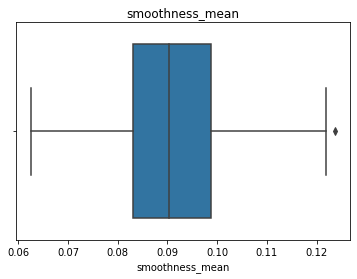

smoothness_mean
    diagnosis  radius_mean  texture_mean  perimeter_mean  area_mean  \
380         B        11.27         12.96           73.16      386.3   

     smoothness_mean  compactness_mean  concavity_mean  concave points_mean  \
380           0.1237            0.1111           0.079               0.0555   

     symmetry_mean  ...  radius_worst  texture_worst  perimeter_worst  \
380         0.2018  ...         12.84          20.53            84.93   

     area_worst  smoothness_worst  compactness_worst  concavity_worst  \
380       476.1             0.161             0.2429           0.2247   

     concave points_worst  symmetry_worst  fractal_dimension_worst  
380                0.1318          0.3343                  0.09215  

[1 rows x 31 columns]

Int64Index([380], dtype='int64')


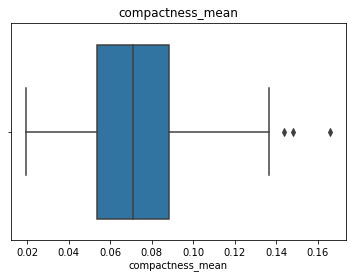

compactness_mean
    diagnosis  radius_mean  texture_mean  perimeter_mean  area_mean  \
65          M        14.78         23.94           97.40      668.3   
375         B        16.17         16.07          106.30      788.5   
518         B        12.88         18.22           84.45      493.1   

     smoothness_mean  compactness_mean  concavity_mean  concave points_mean  \
65            0.1172            0.1479         0.12670              0.09029   
375           0.0988            0.1438         0.06651              0.05397   
518           0.1218            0.1661         0.04825              0.05303   

     symmetry_mean  ...  radius_worst  texture_worst  perimeter_worst  \
65          0.1953  ...         17.31          33.39           114.60   
375         0.1990  ...         16.97          19.14           113.10   
518         0.1709  ...         15.05          24.37            99.31   

     area_worst  smoothness_worst  compactness_worst  concavity_worst  \
65        925.1

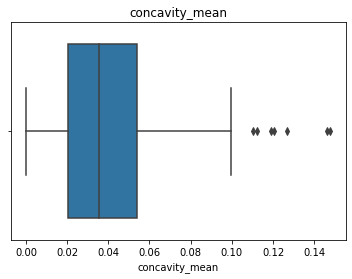

concavity_mean
    diagnosis  radius_mean  texture_mean  perimeter_mean  area_mean  \
65          M        14.78         23.94           97.40      668.3   
86          M        14.48         21.46           94.25      648.2   
91          M        15.37         22.76          100.20      728.2   
238         B        14.22         27.85           92.55      623.9   
328         M        16.27         20.71          106.90      813.7   
484         B        15.73         11.28          102.80      747.2   
536         M        14.27         22.55           93.77      629.8   

     smoothness_mean  compactness_mean  concavity_mean  concave points_mean  \
65           0.11720           0.14790          0.1267              0.09029   
86           0.09444           0.09947          0.1204              0.04938   
91           0.09200           0.10360          0.1122              0.07483   
238          0.08223           0.10390          0.1103              0.04408   
328          0.11690 

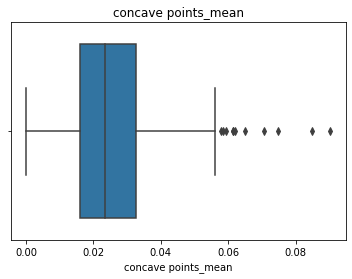

concave points_mean
    diagnosis  radius_mean  texture_mean  perimeter_mean  area_mean  \
65          M        14.78         23.94           97.40      668.3   
89          B        14.64         15.24           95.77      651.9   
91          M        15.37         22.76          100.20      728.2   
99          M        14.42         19.77           94.48      642.5   
123         B        14.50         10.89           94.28      640.7   

     smoothness_mean  compactness_mean  concavity_mean  concave points_mean  \
65           0.11720            0.1479         0.12670              0.09029   
89           0.11320            0.1339         0.09966              0.07064   
91           0.09200            0.1036         0.11220              0.07483   
99           0.09752            0.1141         0.09388              0.05839   
123          0.11010            0.1099         0.08842              0.05778   

     symmetry_mean  ...  radius_worst  texture_worst  perimeter_worst  \
65   

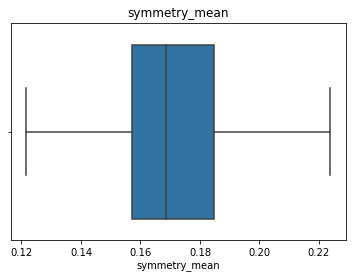

symmetry_mean
Empty DataFrame
Columns: [diagnosis, radius_mean, texture_mean, perimeter_mean, area_mean, smoothness_mean, compactness_mean, concavity_mean, concave points_mean, symmetry_mean, fractal_dimension_mean, radius_se, texture_se, perimeter_se, area_se, smoothness_se, compactness_se, concavity_se, concave points_se, symmetry_se, fractal_dimension_se, radius_worst, texture_worst, perimeter_worst, area_worst, smoothness_worst, compactness_worst, concavity_worst, concave points_worst, symmetry_worst, fractal_dimension_worst]
Index: []

[0 rows x 31 columns]

Int64Index([], dtype='int64')


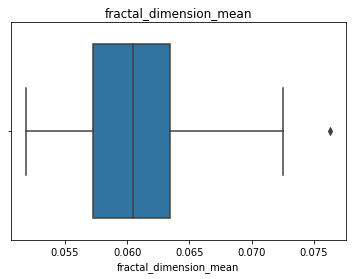

fractal_dimension_mean
    diagnosis  radius_mean  texture_mean  perimeter_mean  area_mean  \
114         B        8.726         15.83           55.84      230.9   

     smoothness_mean  compactness_mean  concavity_mean  concave points_mean  \
114            0.115           0.08201         0.04132              0.01924   

     symmetry_mean  ...  radius_worst  texture_worst  perimeter_worst  \
114         0.1649  ...         9.628          19.62            64.48   

     area_worst  smoothness_worst  compactness_worst  concavity_worst  \
114       284.4            0.1724             0.2364           0.2456   

     concave points_worst  symmetry_worst  fractal_dimension_worst  
114                 0.105          0.2926                   0.1017  

[1 rows x 31 columns]

Int64Index([114], dtype='int64')


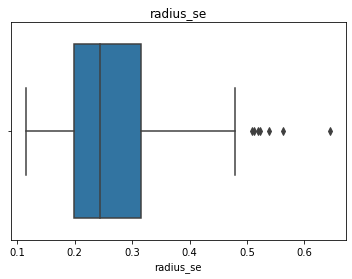

radius_se
    diagnosis  radius_mean  texture_mean  perimeter_mean  area_mean  \
89          B       14.640         15.24           95.77      651.9   
225         B       14.340         13.47           92.51      641.2   
281         B       11.740         14.02           74.24      427.3   
297         M       11.760         18.14           75.00      431.1   
358         B        8.878         15.49           56.74      241.0   
359         B        9.436         18.32           59.82      278.6   
549         B       10.820         24.21           68.89      361.6   

     smoothness_mean  compactness_mean  concavity_mean  concave points_mean  \
89           0.11320           0.13390         0.09966              0.07064   
225          0.09906           0.07624         0.05724              0.04603   
281          0.07813           0.04340         0.02245              0.02763   
297          0.09968           0.05914         0.02685              0.03515   
358          0.08293      

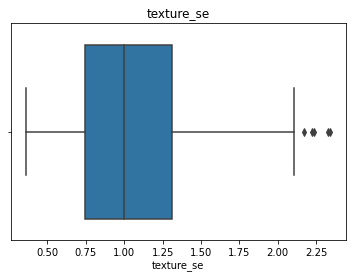

texture_se
    diagnosis  radius_mean  texture_mean  perimeter_mean  area_mean  \
37          B        13.03         18.42           82.61      523.8   
80          B        11.45         20.97           73.81      401.5   
86          M        14.48         21.46           94.25      648.2   
238         B        14.22         27.85           92.55      623.9   
555         B        10.29         27.61           65.67      321.4   

     smoothness_mean  compactness_mean  concavity_mean  concave points_mean  \
37           0.08983           0.03766         0.02562              0.02923   
80           0.11020           0.09362         0.04591              0.02233   
86           0.09444           0.09947         0.12040              0.04938   
238          0.08223           0.10390         0.11030              0.04408   
555          0.09030           0.07658         0.05999              0.02738   

     symmetry_mean  ...  radius_worst  texture_worst  perimeter_worst  \
37          0.

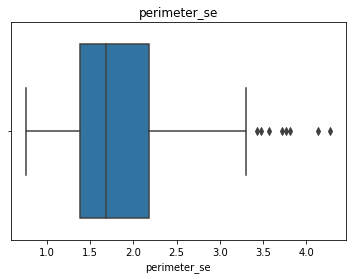

perimeter_se
    diagnosis  radius_mean  texture_mean  perimeter_mean  area_mean  \
89          B       14.640         15.24           95.77      651.9   
157         B       16.840         19.46          108.40      880.2   
225         B       14.340         13.47           92.51      641.2   
281         B       11.740         14.02           74.24      427.3   
297         M       11.760         18.14           75.00      431.1   
358         B        8.878         15.49           56.74      241.0   
549         B       10.820         24.21           68.89      361.6   
566         M       16.600         28.08          108.30      858.1   

     smoothness_mean  compactness_mean  concavity_mean  concave points_mean  \
89           0.11320           0.13390         0.09966              0.07064   
157          0.07445           0.07223         0.05150              0.02771   
225          0.09906           0.07624         0.05724              0.04603   
281          0.07813           

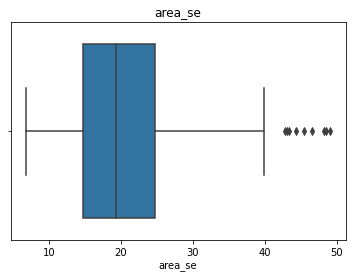

area_se
    diagnosis  radius_mean  texture_mean  perimeter_mean  area_mean  \
16          M        14.68         20.13           94.74      684.5   
89          B        14.64         15.24           95.77      651.9   
100         M        13.61         24.98           88.05      582.7   
157         B        16.84         19.46          108.40      880.2   
171         M        13.43         19.63           85.84      565.4   
225         B        14.34         13.47           92.51      641.2   
297         M        11.76         18.14           75.00      431.1   
328         M        16.27         20.71          106.90      813.7   
566         M        16.60         28.08          108.30      858.1   

     smoothness_mean  compactness_mean  concavity_mean  concave points_mean  \
16           0.09867           0.07200         0.07395              0.05259   
89           0.11320           0.13390         0.09966              0.07064   
100          0.09488           0.08511      

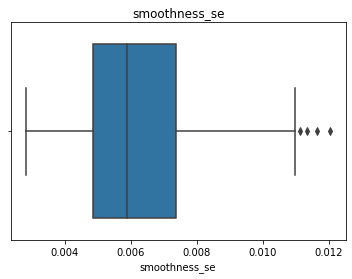

smoothness_se
    diagnosis  radius_mean  texture_mean  perimeter_mean  area_mean  \
97          B        9.787         19.94           62.11      294.5   
163         B       12.340         22.22           79.85      464.5   
234         B        9.567         15.91           60.21      279.6   
555         B       10.290         27.61           65.67      321.4   

     smoothness_mean  compactness_mean  concavity_mean  concave points_mean  \
97           0.10240           0.05301        0.006829             0.007937   
163          0.10120           0.10150        0.053700             0.028220   
234          0.08464           0.04087        0.016520             0.016670   
555          0.09030           0.07658        0.059990             0.027380   

     symmetry_mean  ...  radius_worst  texture_worst  perimeter_worst  \
97          0.1350  ...         10.92          26.29            68.81   
163         0.1551  ...         13.58          28.68            87.36   
234         0.1

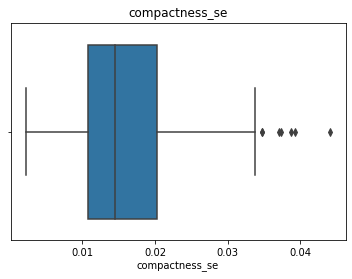

compactness_se
    diagnosis  radius_mean  texture_mean  perimeter_mean  area_mean  \
89          B       14.640         15.24           95.77      651.9   
341         B        9.606         16.84           61.64      280.5   
356         B       13.050         18.59           85.09      512.0   
397         B       12.800         17.46           83.05      508.3   
402         B       12.960         18.29           84.18      525.2   
426         B       10.480         14.98           67.49      333.6   
566         M       16.600         28.08          108.30      858.1   

     smoothness_mean  compactness_mean  concavity_mean  concave points_mean  \
89           0.11320           0.13390         0.09966              0.07064   
341          0.08481           0.09228         0.08422              0.02292   
356          0.10820           0.13040         0.09603              0.05603   
397          0.08044           0.08895         0.07390              0.04083   
402          0.07351 

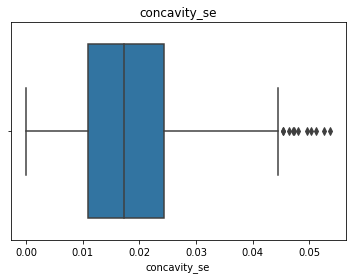

concavity_se
    diagnosis  radius_mean  texture_mean  perimeter_mean  area_mean  \
86          M       14.480         21.46           94.25      648.2   
91          M       15.370         22.76          100.20      728.2   
124         B       13.370         16.39           86.10      553.5   
301         B       12.460         19.89           80.43      471.3   
341         B        9.606         16.84           61.64      280.5   

     smoothness_mean  compactness_mean  concavity_mean  concave points_mean  \
86           0.09444           0.09947         0.12040              0.04938   
91           0.09200           0.10360         0.11220              0.07483   
124          0.07115           0.07325         0.08092              0.02800   
301          0.08451           0.10140         0.06830              0.03099   
341          0.08481           0.09228         0.08422              0.02292   

     symmetry_mean  ...  radius_worst  texture_worst  perimeter_worst  \
86          

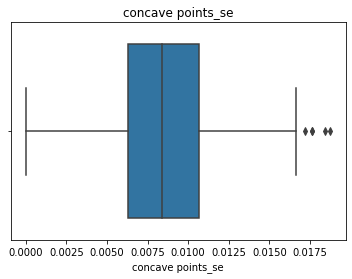

concave points_se
    diagnosis  radius_mean  texture_mean  perimeter_mean  area_mean  \
86          M        14.48         21.46           94.25      648.2   
91          M        15.37         22.76          100.20      728.2   
281         B        11.74         14.02           74.24      427.3   
356         B        13.05         18.59           85.09      512.0   
555         B        10.29         27.61           65.67      321.4   

     smoothness_mean  compactness_mean  concavity_mean  concave points_mean  \
86           0.09444           0.09947         0.12040              0.04938   
91           0.09200           0.10360         0.11220              0.07483   
281          0.07813           0.04340         0.02245              0.02763   
356          0.10820           0.13040         0.09603              0.05603   
555          0.09030           0.07658         0.05999              0.02738   

     symmetry_mean  ...  radius_worst  texture_worst  perimeter_worst  \
86     

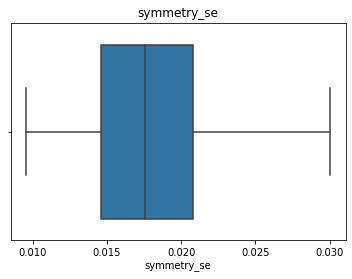

symmetry_se
Empty DataFrame
Columns: [diagnosis, radius_mean, texture_mean, perimeter_mean, area_mean, smoothness_mean, compactness_mean, concavity_mean, concave points_mean, symmetry_mean, fractal_dimension_mean, radius_se, texture_se, perimeter_se, area_se, smoothness_se, compactness_se, concavity_se, concave points_se, symmetry_se, fractal_dimension_se, radius_worst, texture_worst, perimeter_worst, area_worst, smoothness_worst, compactness_worst, concavity_worst, concave points_worst, symmetry_worst, fractal_dimension_worst]
Index: []

[0 rows x 31 columns]

Int64Index([], dtype='int64')


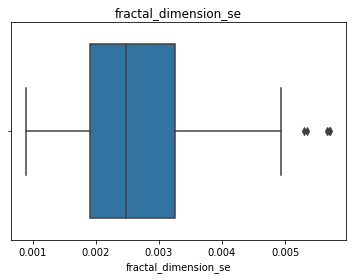

fractal_dimension_se
    diagnosis  radius_mean  texture_mean  perimeter_mean  area_mean  \
97          B        9.787         19.94           62.11      294.5   
163         B       12.340         22.22           79.85      464.5   
336         B       12.990         14.23           84.08      514.3   
356         B       13.050         18.59           85.09      512.0   
560         B       14.050         27.15           91.38      600.4   

     smoothness_mean  compactness_mean  concavity_mean  concave points_mean  \
97           0.10240           0.05301        0.006829             0.007937   
163          0.10120           0.10150        0.053700             0.028220   
336          0.09462           0.09965        0.037380             0.020980   
356          0.10820           0.13040        0.096030             0.056030   
560          0.09929           0.11260        0.044620             0.043040   

     symmetry_mean  ...  radius_worst  texture_worst  perimeter_worst  \
97  

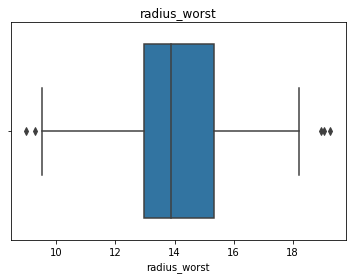

radius_worst
    diagnosis  radius_mean  texture_mean  perimeter_mean  area_mean  \
16          M       14.680         20.13           94.74      684.5   
46          B        8.196         16.84           51.71      201.9   
175         B        8.671         14.45           54.42      227.2   
328         M       16.270         20.71          106.90      813.7   
566         M       16.600         28.08          108.30      858.1   

     smoothness_mean  compactness_mean  concavity_mean  concave points_mean  \
16           0.09867           0.07200         0.07395             0.052590   
46           0.08600           0.05943         0.01588             0.005917   
175          0.09138           0.04276         0.00000             0.000000   
328          0.11690           0.13190         0.14780             0.084880   
566          0.08455           0.10230         0.09251             0.053020   

     symmetry_mean  ...  radius_worst  texture_worst  perimeter_worst  \
16          

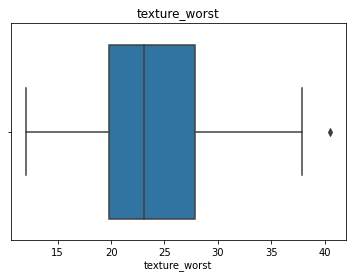

texture_worst
    diagnosis  radius_mean  texture_mean  perimeter_mean  area_mean  \
238         B        14.22         27.85           92.55      623.9   

     smoothness_mean  compactness_mean  concavity_mean  concave points_mean  \
238          0.08223            0.1039          0.1103              0.04408   

     symmetry_mean  ...  radius_worst  texture_worst  perimeter_worst  \
238         0.1342  ...         15.75          40.54            102.5   

     area_worst  smoothness_worst  compactness_worst  concavity_worst  \
238       764.0            0.1081             0.2426           0.3064   

     concave points_worst  symmetry_worst  fractal_dimension_worst  
238               0.08219           0.189                  0.07796  

[1 rows x 31 columns]

Int64Index([238], dtype='int64')


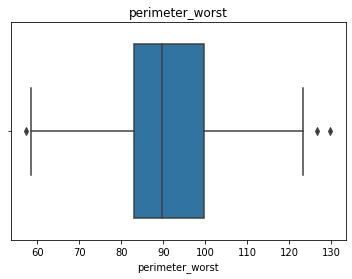

perimeter_worst
    diagnosis  radius_mean  texture_mean  perimeter_mean  area_mean  \
46          B        8.196         16.84           51.71      201.9   
328         M       16.270         20.71          106.90      813.7   
566         M       16.600         28.08          108.30      858.1   

     smoothness_mean  compactness_mean  concavity_mean  concave points_mean  \
46           0.08600           0.05943         0.01588             0.005917   
328          0.11690           0.13190         0.14780             0.084880   
566          0.08455           0.10230         0.09251             0.053020   

     symmetry_mean  ...  radius_worst  texture_worst  perimeter_worst  \
46          0.1769  ...         8.964          21.96            57.26   
328         0.1948  ...        19.280          30.38           129.80   
566         0.1590  ...        18.980          34.12           126.70   

     area_worst  smoothness_worst  compactness_worst  concavity_worst  \
46        242.2 

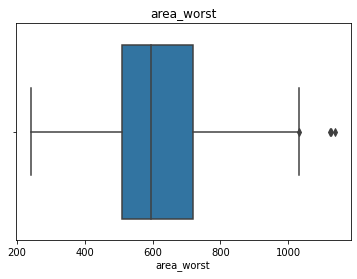

area_worst
    diagnosis  radius_mean  texture_mean  perimeter_mean  area_mean  \
16          M        14.68         20.13           94.74      684.5   
157         B        16.84         19.46          108.40      880.2   
328         M        16.27         20.71          106.90      813.7   
566         M        16.60         28.08          108.30      858.1   

     smoothness_mean  compactness_mean  concavity_mean  concave points_mean  \
16           0.09867           0.07200         0.07395              0.05259   
157          0.07445           0.07223         0.05150              0.02771   
328          0.11690           0.13190         0.14780              0.08488   
566          0.08455           0.10230         0.09251              0.05302   

     symmetry_mean  ...  radius_worst  texture_worst  perimeter_worst  \
16          0.1586  ...         19.07          30.88            123.4   
157         0.1844  ...         18.22          28.07            120.3   
328         0.1948

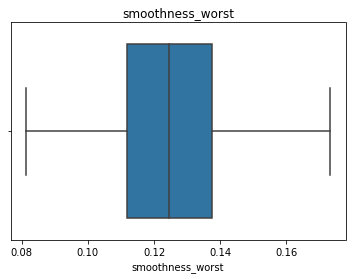

smoothness_worst
Empty DataFrame
Columns: [diagnosis, radius_mean, texture_mean, perimeter_mean, area_mean, smoothness_mean, compactness_mean, concavity_mean, concave points_mean, symmetry_mean, fractal_dimension_mean, radius_se, texture_se, perimeter_se, area_se, smoothness_se, compactness_se, concavity_se, concave points_se, symmetry_se, fractal_dimension_se, radius_worst, texture_worst, perimeter_worst, area_worst, smoothness_worst, compactness_worst, concavity_worst, concave points_worst, symmetry_worst, fractal_dimension_worst]
Index: []

[0 rows x 31 columns]

Int64Index([], dtype='int64')


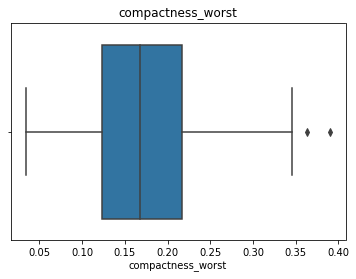

compactness_worst
    diagnosis  radius_mean  texture_mean  perimeter_mean  area_mean  \
44          M        13.17         21.81           85.42      531.5   
227         B        15.00         15.51           97.45      684.5   

     smoothness_mean  compactness_mean  concavity_mean  concave points_mean  \
44           0.09714            0.1047         0.08259              0.05252   
227          0.08371            0.1096         0.06505              0.03780   

     symmetry_mean  ...  radius_worst  texture_worst  perimeter_worst  \
44          0.1746  ...         16.23          29.89            105.5   
227         0.1881  ...         16.41          19.31            114.2   

     area_worst  smoothness_worst  compactness_worst  concavity_worst  \
44        740.7            0.1503             0.3904           0.3728   
227       808.2            0.1136             0.3627           0.3402   

     concave points_worst  symmetry_worst  fractal_dimension_worst  
44                 0.

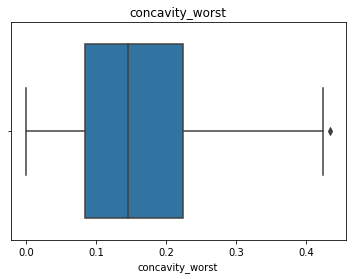

concavity_worst
    diagnosis  radius_mean  texture_mean  perimeter_mean  area_mean  \
341         B        9.606         16.84           61.64      280.5   

     smoothness_mean  compactness_mean  concavity_mean  concave points_mean  \
341          0.08481           0.09228         0.08422              0.02292   

     symmetry_mean  ...  radius_worst  texture_worst  perimeter_worst  \
341         0.2036  ...         10.75          23.07            71.25   

     area_worst  smoothness_worst  compactness_worst  concavity_worst  \
341       353.6            0.1233             0.3416           0.4341   

     concave points_worst  symmetry_worst  fractal_dimension_worst  
341                0.0812          0.2982                  0.09825  

[1 rows x 31 columns]

Int64Index([341], dtype='int64')


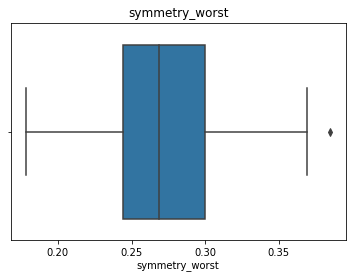

symmetry_worst
    diagnosis  radius_mean  texture_mean  perimeter_mean  area_mean  \
154         B        13.15         15.34           85.31      538.9   

     smoothness_mean  compactness_mean  concavity_mean  concave points_mean  \
154          0.09384           0.08498         0.09293              0.03483   

     symmetry_mean  ...  radius_worst  texture_worst  perimeter_worst  \
154         0.1822  ...         14.77           20.5            97.67   

     area_worst  smoothness_worst  compactness_worst  concavity_worst  \
154       677.3            0.1478             0.2256           0.3009   

     concave points_worst  symmetry_worst  fractal_dimension_worst  
154               0.09722          0.3849                  0.08633  

[1 rows x 31 columns]

Int64Index([154], dtype='int64')


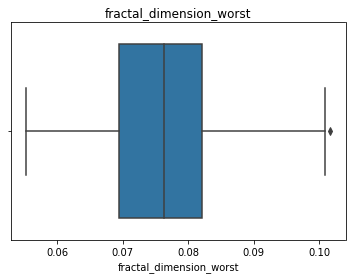

fractal_dimension_worst
    diagnosis  radius_mean  texture_mean  perimeter_mean  area_mean  \
114         B        8.726         15.83           55.84      230.9   

     smoothness_mean  compactness_mean  concavity_mean  concave points_mean  \
114            0.115           0.08201         0.04132              0.01924   

     symmetry_mean  ...  radius_worst  texture_worst  perimeter_worst  \
114         0.1649  ...         9.628          19.62            64.48   

     area_worst  smoothness_worst  compactness_worst  concavity_worst  \
114       284.4            0.1724             0.2364           0.2456   

     concave points_worst  symmetry_worst  fractal_dimension_worst  
114                 0.105          0.2926                   0.1017  

[1 rows x 31 columns]

Int64Index([114], dtype='int64')


In [ ]:
def catchOutliers(df,col, plot=False,q1=0.25, q3=0.75):
    if plot:
       sns.boxplot(df[col])
       plt.title(col)
       plt.show()
    lowerLimit, upperLimit = outlierThreshold(df, col, q1 = 0.25, q3 = 0.75)
    valuesDf = df[(df[col] < lowerLimit) | (df[col] > upperLimit)]
    if valuesDf.shape[0] > 10:
       return str(col) + "\n" + str(valuesDf.head()) + "\n\n" + str(valuesDf.index)
    else:
       return str(col) + "\n" + str(valuesDf) + "\n\n" + str(valuesDf.index)
for col in outlierCols:
    print(catchOutliers(df,col,plot = True, q1 = 0.25, q3 = 0.75))

In [ ]:
df.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
19,B,13.540,14.36,87.46,566.3,0.09779,0.08129,0.06664,0.04781,0.1885,...,15.11,19.26,99.70,711.2,0.1440,0.1773,0.23900,0.12880,0.2977,0.07259
20,B,13.080,15.71,85.63,520.0,0.10750,0.12700,0.04568,0.03110,0.1967,...,14.50,20.49,96.09,630.5,0.1312,0.2776,0.18900,0.07283,0.3184,0.08183
21,B,9.504,12.44,60.34,273.9,0.10240,0.06492,0.02956,0.02076,0.1815,...,10.23,15.66,65.13,314.9,0.1324,0.1148,0.08867,0.06227,0.2450,0.07773
40,M,13.440,21.58,86.18,563.0,0.08162,0.06031,0.03110,0.02031,0.1784,...,15.93,30.25,102.50,787.9,0.1094,0.2043,0.20850,0.11120,0.2994,0.07146
48,B,12.050,14.63,78.04,449.3,0.10310,0.09092,0.06592,0.02749,0.1675,...,13.76,20.70,89.88,582.6,0.1494,0.2156,0.30500,0.06548,0.2747,0.08301


In [ ]:
from sklearn.preprocessing import LabelEncoder
labelEncoder = LabelEncoder()
df["diagnosis"] = labelEncoder.fit_transform(df["diagnosis"])
df.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
16,1,14.680,20.13,94.74,684.5,0.09867,0.07200,0.07395,0.05259,0.1586,...,19.07,30.88,123.40,1138.0,0.14640,0.18710,0.29140,0.16090,0.3029,0.08216
19,0,13.540,14.36,87.46,566.3,0.09779,0.08129,0.06664,0.04781,0.1885,...,15.11,19.26,99.70,711.2,0.14400,0.17730,0.23900,0.12880,0.2977,0.07259
20,0,13.080,15.71,85.63,520.0,0.10750,0.12700,0.04568,0.03110,0.1967,...,14.50,20.49,96.09,630.5,0.13120,0.27760,0.18900,0.07283,0.3184,0.08183
21,0,9.504,12.44,60.34,273.9,0.10240,0.06492,0.02956,0.02076,0.1815,...,10.23,15.66,65.13,314.9,0.13240,0.11480,0.08867,0.06227,0.2450,0.07773
37,0,13.030,18.42,82.61,523.8,0.08983,0.03766,0.02562,0.02923,0.1467,...,13.30,22.81,84.46,545.9,0.09701,0.04619,0.04833,0.05013,0.1987,0.06169


0: benign => iyi huylu kanser

---

1: malignant  => kotu huylu kanser

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC 
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier
from lightgbm import LGBMClassifier
from sklearn.decomposition import PCA


def trainTest(df,target):
    X = df.drop(target, axis = 1).values
    y = df[target].values.reshape(-1,1)
    X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.3, random_state = 42)
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
    return X_train, X_test, y_train, y_test
def models():
  classifier = [
      ("LogisticRegression",LogisticRegression()),
      ("GaussianNB",GaussianNB()),
      ("DecisionTreeClassifier",DecisionTreeClassifier()),
      ("MLPClassifier",MLPClassifier()),
      ("KNeighborsClassifier",KNeighborsClassifier()),
      ("GradientBoostingClassifier",GradientBoostingClassifier()),
      ("LGBMClassifier",LGBMClassifier()),
      ("AdaBoostClassifier",AdaBoostClassifier())
  ]
  return classifier
def modelStep(cls, X_train, X_test, y_train, y_test, y_pred, name): # model asamalari
       cv_results = cross_val_score(cls,X_train, y_train, cv = 10, scoring = "accuracy")
       cv_mean = cv_results.mean()
       mse = mean_squared_error(y_test, y_pred)
       mae = mean_absolute_error(y_test,y_pred)
       rmse = np.sqrt(mean_squared_error(y_test, y_pred))
       r2_Score = r2_score(y_test, y_pred)
       #realY = pd.DataFrame(y_test, columns = ["Real_Y"])
       #predictY = pd.DataFrame(y_pred, columns = ["Predict_Y"])
       #resultDf = pd.concat([realY, predictY], axis = 1)
       print("Model: {}\nMSE: {}\nMAE: {}\nCV Mean: {}\nR2 Score: {}\nRMSE: {}\n".format(name, mse, mae, cv_mean, r2_Score, rmse))

def modelRun(df, target, pcaA = False, pca_number = 2):
    X_train, X_test, y_train, y_test = trainTest(df,target)
    classifier = models()
    for name, model in classifier:
       cls = model.fit(X_train, y_train)
       y_pred = cls.predict(X_test)
       print("**************************** PCA OLMADAN {} ************************".format(name))
       print("X_train shape: {}\nX_test shape: {}\n".format(X_train.shape, X_test.shape))
       modelStep(cls,X_train, X_test, y_train, y_test, y_pred, name)  

       if pcaA == True:
            print("**************************** PCA {} ************************".format(name))
            pca = PCA(n_components = pca_number)
            X_train_pca = pca.fit_transform(X_train)
            X_test_pca = pca.transform(X_test)
            cls = model.fit(X_train_pca, y_train)
            y_pred_pca = cls.predict(X_test_pca)  
            print("X_train_pca shape: {}\nX_test_pca shape: {}\n".format(X_train_pca.shape, X_test_pca.shape))
            modelStep(cls,X_train_pca, X_test_pca, y_train, y_test, y_pred_pca, name)

    #return resultDf
modelRun(df,"diagnosis", pcaA = True, pca_number = 2)

**************************** PCA OLMADAN LogisticRegression ************************
X_train shape: (193, 30)
X_test shape: (84, 30)

Model: LogisticRegression
MSE: 0.023809523809523808
MAE: 0.023809523809523808
CV Mean: 0.943157894736842
R2 Score: 0.475
RMSE: 0.21821789023599236

**************************** PCA LogisticRegression ************************
X_train_pca shape: (193, 2)
X_test_pca shape: (84, 2)

Model: LogisticRegression
MSE: 0.03571428571428571
MAE: 0.03571428571428571
CV Mean: 0.9118421052631579
R2 Score: 0.2124999999999999
RMSE: 0.21821789023599236

**************************** PCA OLMADAN GaussianNB ************************
X_train shape: (193, 30)
X_test shape: (84, 30)

Model: GaussianNB
MSE: 0.13095238095238096
MAE: 0.13095238095238096
CV Mean: 0.8963157894736842
R2 Score: -1.8875000000000002
RMSE: 0.21821789023599236

**************************** PCA GaussianNB ************************
X_train_pca shape: (193, 2)
X_test_pca shape: (84, 2)

Model: GaussianNB
MSE: 

Logistic Regression ve KNeighborsClassifier iyi bir sonuc vermistir.

In [ ]:
from sklearn.model_selection import GridSearchCV
X_train, X_test, y_train, y_test = trainTest(df,"diagnosis")
knn = KNeighborsClassifier()
grid_params = {
    "n_neighbors":[3,5,10,15],
    "weights":["uniform","distance"],
    "algorithm":["auto","ball_tree","kd_tree","brute"],
    "metric":["euclidean","manhattan"]

}
gscv = GridSearchCV(estimator = knn, param_grid = grid_params, scoring = "accuracy", cv = 10)
gscv.fit(X_train, y_train)
bestParams = gscv.best_params_
bestResult = gscv.best_score_
print("Best Params: {}\nBest Result: {}".format(bestParams, bestResult)) 

Best Params: {'algorithm': 'auto', 'metric': 'euclidean', 'n_neighbors': 3, 'weights': 'uniform'}
Best Result: 0.958421052631579


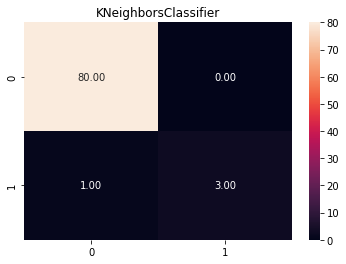


MSE: 0.011904761904761904
MAE: 0.011904761904761904
RMSE: 0.10910894511799618
R2 Score: 0.7375
F1 Score: 0.8571428571428571
Accuracy Score: 0.9880952380952381



In [ ]:
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix
knn = KNeighborsClassifier(n_neighbors=3, algorithm="auto", metric = "euclidean", weights="uniform")
knn.fit(X_train, y_train)
y_pred = knn.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2_Score = r2_score(y_test, y_pred)
f1_score = f1_score(y_test, y_pred)
acc_score = accuracy_score(y_test, y_pred)
sns.heatmap(confusion_matrix(y_test, y_pred), annot = True, fmt = ".2f")
plt.title("KNeighborsClassifier")
plt.show()
print("\nMSE: {}\nMAE: {}\nRMSE: {}\nR2 Score: {}\nF1 Score: {}\nAccuracy Score: {}\n".format(mse, mae, rmse, r2_Score,f1_score, acc_score))